In [23]:
!git clone https://github.com/facebookresearch/co-tracker
%cd co-tracker
!pip install -e .
!pip install opencv-python matplotlib moviepy flow_vis
!mkdir checkpoints
%cd checkpoints
!wget https://huggingface.co/facebook/cotracker3/resolve/main/scaled_offline.pth
%cd ..
import os
import torch
import cv2
import numpy as np

from base64 import b64encode
from cotracker.utils.visualizer import Visualizer, read_video_from_path
from IPython.display import HTML

'co-tracker'에 복제합니다...
remote: Enumerating objects: 421, done.
remote: Counting objects: 100% (283/283), done.
remote: Compressing objects: 100% (158/158), done.
remote: Total 421 (delta 184), reused 178 (delta 124), pack-reused 138 (from 1)
오브젝트를 받는 중: 100% (421/421), 74.98 MiB | 20.21 MiB/s, 완료.
델타를 알아내는 중: 100% (213/213), 완료.
/home/user/DHKIM/Materials_DICOM/co-tracker


/home/user/miniconda3/envs/cotracker/lib/python3.12/site-packages/IPython/core/magics/osm.py:417: UserWarning: This is now an optional IPython functionality, setting dhist requires you to install the `pickleshare` library.
  self.shell.db['dhist'] = compress_dhist(dhist)[-100:]


Obtaining file:///home/user/DHKIM/Materials_DICOM/co-tracker
  Preparing metadata (setup.py) ... done
    torch (>=1.8.*)
           ~~~~~~^
  Attempting uninstall: cotracker
    Found existing installation: cotracker 3.0
    Uninstalling cotracker-3.0:
      Successfully uninstalled cotracker-3.0
  DEPRECATION: Legacy editable install of cotracker==3.0 from file:///home/user/DHKIM/Materials_DICOM/co-tracker (setup.py develop) is deprecated. pip 25.0 will enforce this behaviour change. A possible replacement is to add a pyproject.toml or enable --use-pep517, and use setuptools >= 64. If the resulting installation is not behaving as expected, try using --config-settings editable_mode=compat. Please consult the setuptools documentation for more information. Discussion can be found at https://github.com/pypa/pip/issues/11457
  Running setup.py develop for cotracker
    torch (>=1.8.*)
           ~~~~~~^
/home/user/DHKIM/Materials_DICOM/co-tracker/checkpoints
--2024-11-22 21:48:14--  https

In [36]:
video = read_video_from_path('/home/user/DHKIM/Materials_DICOM/mp4/30002456/20181024/XA/004.mp4')
video_tensor = torch.from_numpy(video).permute(0, 3, 1, 2)[None].float()

print("Video tensor shape:", video_tensor.shape)
print(video.shape)


def show_video(video_path):
    video_file = open(video_path, "r+b").read()
    video_url = f"data:video/mp4;base64,{b64encode(video_file).decode()}"
    return HTML(f"""<video width="640" height="480" autoplay loop controls><source src="{video_url}"></video>""")
 
show_video("/home/user/DHKIM/Materials_DICOM/mp4/30002456/20181024/XA/004.mp4")

Video tensor shape: torch.Size([1, 57, 3, 512, 512])
(57, 512, 512, 3)


In [ ]:
#Shape[batch, frames, RGB, height, width]

#apple.mp4 : Video tensor shape: torch.Size([1, 50, 3, 720, 1296])

In [28]:
from cotracker.predictor import CoTrackerPredictor

model = CoTrackerPredictor(
    checkpoint=os.path.join(
        '/home/user/DHKIM/Materials_DICOM/co-tracker/checkpoints/scaled_offline.pth'
    )
)

In [31]:
if torch.cuda.is_available():
    model = model.cuda()
    # Convert numpy array to a PyTorch tensor before calling .cuda()
    video = torch.from_numpy(video).float().cuda()

In [32]:
# Path to the .pt file
file_path = '/home/user/DHKIM/Materials_DICOM/tensor/30002456/20181024/XA/004_frame_20.pt'

# Load the tensor from the file
queries = torch.load(file_path)

# Move to GPU if available
if torch.cuda.is_available():
    queries = queries.cuda()

print(queries)

tensor([[ 20.0000,  14.2222,  73.6970],
        [ 20.0000,  67.8788,  62.7071],
        [ 20.0000, 175.8384,  27.1515],
        [ 20.0000, 216.5657,  43.3131],
        [ 20.0000, 239.8384,  58.8283],
        [ 20.0000, 272.8081, 104.7273],
        [ 20.0000, 306.4243, 156.4444],
        [ 20.0000, 321.9394, 195.8788],
        [ 20.0000, 331.6364, 236.6061],
        [ 20.0000, 319.3535, 285.0909],
        [ 20.0000, 296.7273, 354.9091],
        [ 20.0000, 298.6667, 380.7677],
        [ 20.0000, 322.5858, 413.7374],
        [ 20.0000, 298.0202, 457.6970],
        [ 20.0000, 330.3434, 485.4950],
        [ 20.0000, 346.5050, 496.4849],
        [ 20.0000, 328.4041, 161.6162],
        [ 20.0000, 364.6060, 194.5859],
        [ 20.0000, 370.4243, 234.6667],
        [ 20.0000, 377.5353, 252.7677],
        [ 20.0000, 401.4546, 259.8788],
        [ 20.0000, 262.4647, 155.7980],
        [ 20.0000, 211.3939, 216.5657],
        [ 20.0000, 243.7172, 221.7374],
        [ 20.0000, 230.7879, 341.3333],


IndexError: tuple index out of range

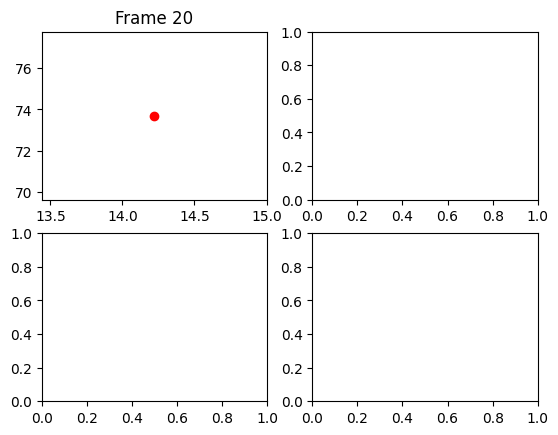

In [34]:
import matplotlib.pyplot as plt
# Create a list of frame numbers corresponding to each point
frame_numbers = queries[:,0].int().tolist()

fig, axs = plt.subplots(2, 2)
axs = axs.flatten()

for i, (query, frame_number) in enumerate(zip(queries, frame_numbers)):
    ax = axs[i]
    ax.plot(query[1].item(), query[2].item(), 'ro') 
    
    ax.set_title("Frame {}".format(frame_number))
    ax.set_xlim(0, video.shape[4])
    ax.set_ylim(0, video.shape[3])
    ax.invert_yaxis()
    
plt.tight_layout()
plt.show()

In [41]:
import torch

# Assuming `video` is a NumPy array with shape (T, H, W, C)
video_tensor = torch.from_numpy(video).permute(0, 3, 1, 2)  # Convert to (T, C, H, W)

# Add the batch dimension to get (B, T, C, H, W)
video_tensor = video_tensor.unsqueeze(0).float()

# Print shape for verification
print("Video tensor shape:", video_tensor.shape)


Video tensor shape: torch.Size([1, 57, 3, 512, 512])


In [44]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

video_tensor = video_tensor.to(device)  # Move video to the same device as the model
queries = queries.to(device)           # Move queries to the same device

model = model.to(device)  # Move model to the same device

print("Video tensor device:", video_tensor.device)
print("Queries device:", queries.device)
print("Model device:", next(model.parameters()).device)


Video tensor device: cuda:0
Queries device: cuda:0
Model device: cuda:0


In [45]:
pred_tracks, pred_visibility = model(video_tensor, queries=queries[None])

In [54]:
vis = Visualizer(
    save_dir='./videos',
    linewidth=2,
    mode='cool',
    tracks_leave_trace=0
)

In [57]:
pred_tracks, pred_visibility = model(video_tensor, queries=queries[None], backward_tracking=True)
vis.visualize(
    video=video_tensor,
    tracks=pred_tracks,
    visibility=pred_visibility,
    filename='30002456_2018_1024_XA_004');

Video saved to ./videos/30002456_2018_1024_XA_004.mp4


In [58]:
show_video("./videos/30002456_2018_1024_XA_004.mp4")